In [3]:
# Read the data from local folder
import os
import pandas as pd
import utils
import numpy as np

ROOT = os.path.abspath('dataset')

df_trans = pd.read_csv(os.path.join(ROOT, 'JusticIA_DatosTranscripciones.csv'))

df_trans.info()
df_trans['NombreArchivo'][200]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2959 entries, 0 to 2958
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Fuente         2959 non-null   object
 1   Conjunto       2959 non-null   object
 2   NombreArchivo  2959 non-null   object
 3   Texto          2000 non-null   object
 4   MetodoTexto    2000 non-null   object
dtypes: object(5)
memory usage: 115.7+ KB


'Ficheros_Detenidos_Desaparecidos_Mendez_Alvarado_Maria_de_Jesus_Mendez_Alvarado_Maria_de_Jesus-20-.JPG'

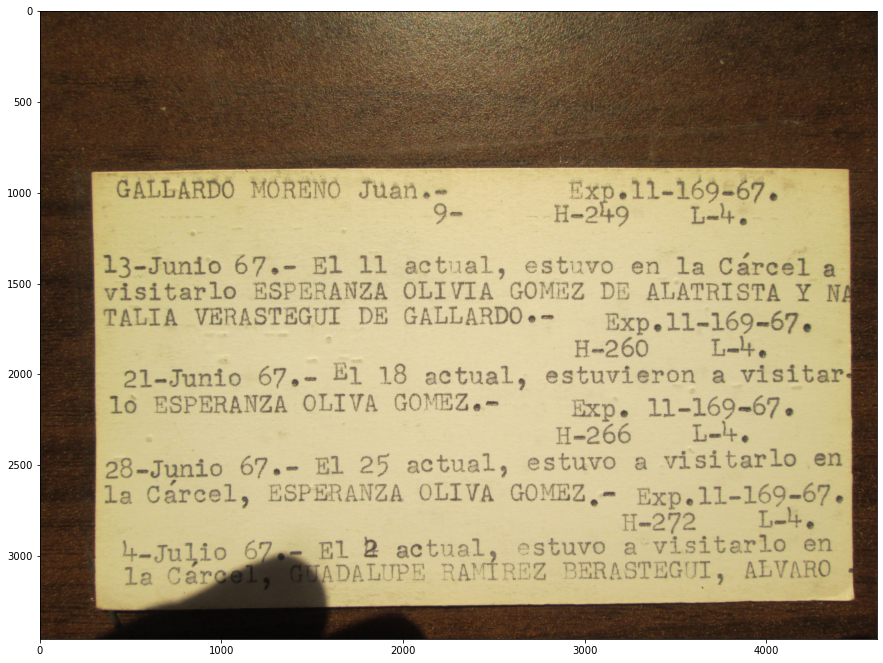

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(utils.open_idx(df_trans, ROOT, 3))
plt.show()

 # Test how a manually cropped image performs in tesseract

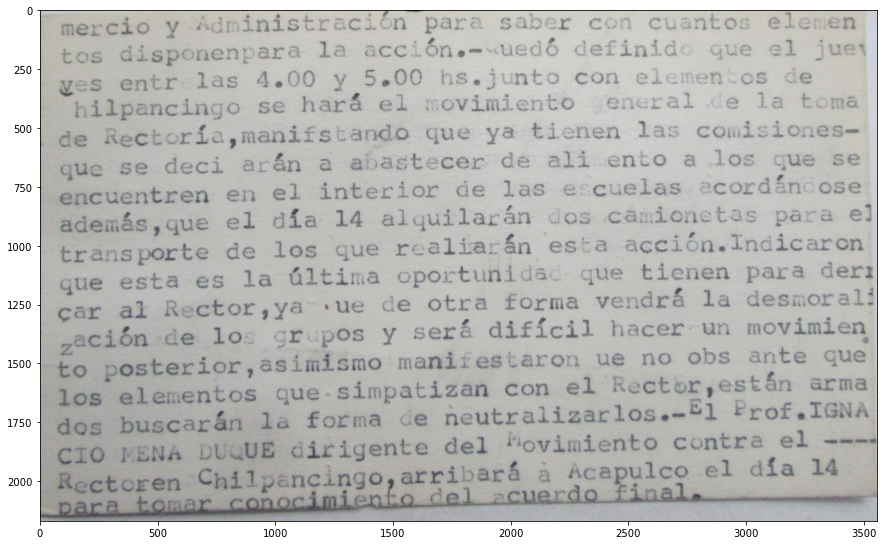

In [5]:
import cv2
img = cv2.imread('dataset/cropped_images/Ficheros_UAG_73-10-29_a_73-12-07_UAG,_fichas-80-.JPG')

h_img, w_img, _ = img.shape

utils.show_bgr_image_in_plt(img)



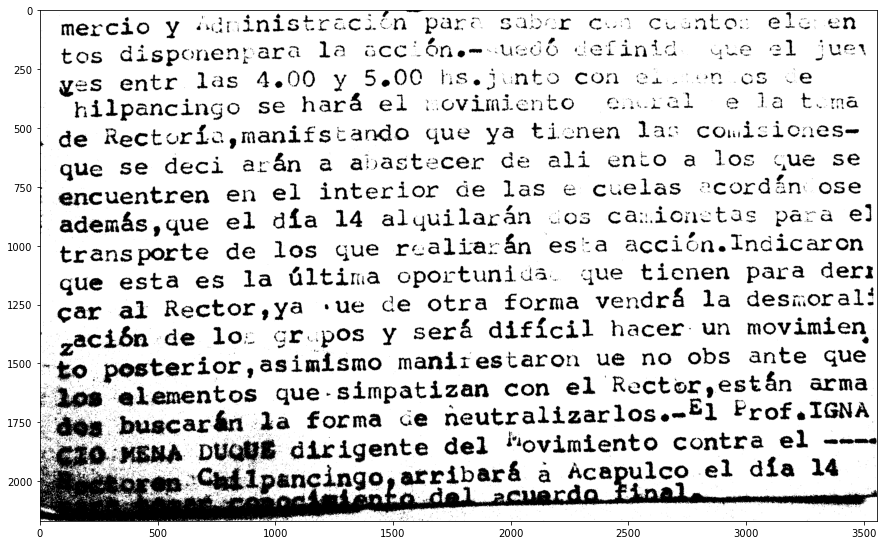

In [6]:
# Apply a simple threshold
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, img_bw = cv2.threshold(img_gray, 160, 255, cv2.THRESH_BINARY)
plt.imshow(img_bw, 'gray')

In [7]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_blurred = cv2.medianBlur(img_gray,5)
th2 = cv2.adaptiveThreshold(img_blurred,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img_blurred,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

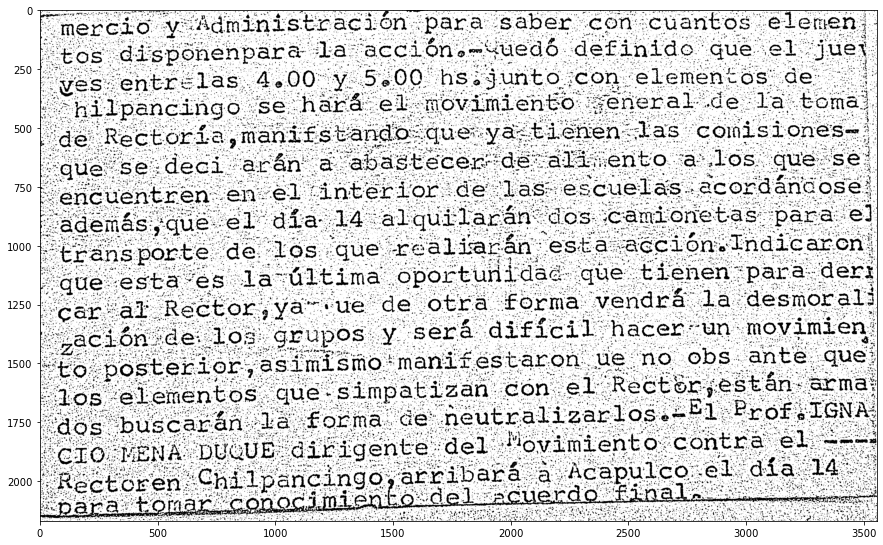

In [8]:
utils.show_bgr_image_in_plt(th2)

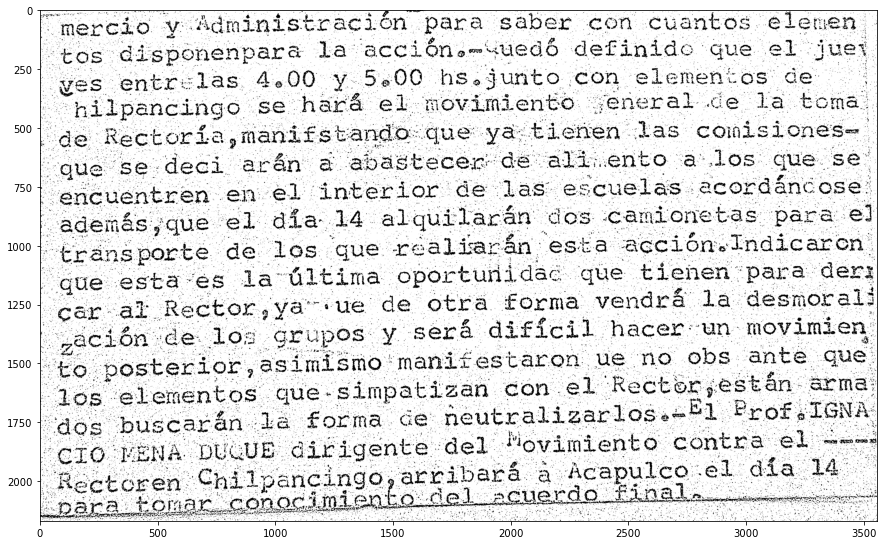

In [9]:
utils.show_bgr_image_in_plt(th3)

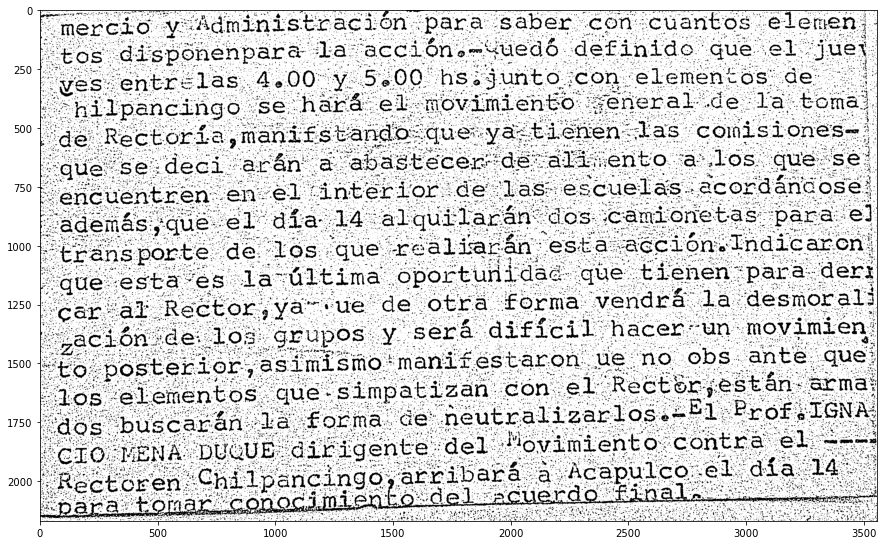

In [10]:
_, th2_bw = cv2.threshold(th2, 126, 255, cv2.THRESH_BINARY)
plt.imshow(th2_bw, 'gray')

In [11]:
import pytesseract
custom_config = r'-l spa'
string_gray = pytesseract.image_to_string(img_gray, config=custom_config)
print(string_gray)

mercio y “dministración para saber con cuantos elemen
tos disponenpara la acción».-«uedó definido que el juer
yes entr:las 4.00 y 5,00 hs.junto con elementos de
hilpancingo se hará el movimiento .eneral ce la toma
. de Rectoría, manifstando que ya tienen las comisiones-
- que se deci aráín a abastecer de ali ento a.los que se
encuentren en el interior de las e:cuelas acordíncose
' además,que el día 14 alquilarán dos camionetas para el
-Eransporte de los que realiarán esta acción. Indicaron
que esta es la última oportunida: que tienen para derz
Rector, ya «ue de otra forma vendrá la desmorall
ión de los grupos y será difícil hacer: un movimien
posterior,asimismo manifestaron ue no obs ante que
Jlementos que-simpatizan con el Rector,están arma
arán la forma de neutralizarlos.-E1l Prof.IGNA
E dirigente del Movimiento contra el ==--
ancingo,arribará a Acapulco el dia M.
tal »=CuUercdi O iS SS

t1CA ES

    
  
   
 
 
 
 

 
 

  
    



In [12]:
string_orig = pytesseract.image_to_string(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), config=custom_config)
print(string_orig)

_ mercio y Adminis tración para saber con cuantos elemen
tos disponenpara la accí óne-«uedó JA que el 16

mo

oyes entr.las 4.00 y 5.00 hs.junto con elementos de
- hilpancingo se hará el movimiento oral de la toma
de Rectoríaymanifstando que ya tienen las comisiones-
que se deci arín a abastecer de alí ento a los que se
encuentren en el interior de las e scuelas acordáncose
demás ,que el día 14 alquilarán dos camionetas para el
“transporte de los que realiarán esta acción. Indicaron
- qUe esta es la última oportunidac que tienen para der
Nr al Rector,ya «ue de otra forma el la desmorali
ación de lo: grupos y será difícil hacer: un movimien
sterior, asimismo maniíestaron ue no obs ante que
, que-simpatizan con el Rector,están arma
la forma ce heutralizarlos.-É1 Prof .IGNA
irigente del Ir contes e

 
 
 
 

 
  
 
 
 
  
    

 

    



In [13]:
string_bw = pytesseract.image_to_string(img_bw, config=custom_config)
print(string_bw)

* , 2 2 z £ q e. ma 1
mercio y “diinl Cot MA paro Sado Cu% Cu anto: elc en

| cia

tos disponenpara la acción uedó definta u.e 21 Jjuer
yes entr las 4.00 y 5.00 hs.junto corn

hilpancingo se hará el covimiento Cuias
de Rectoríc2,manifstando que ya tienen laz couicicies-
que se deci arán a abastecer de ali ento a los que se
encuentren en el interior de las € cuelas »cordén: ose
además, que el día 14 alquilarán os canionetas para el
transporte de los que rcvalia:ón es:a acción. indicaron
que esta es la últina oportunida. que tienen para der1
car al Rector,ya «ue de otra forma vendrá la desnoral!
_ ¿ación de lo: Grpos y será difícil hacer. un movimien
to posterior,asimísmo manizestaron ue no obs ante que

es elementos que-simpatizan con el Rector,están arma
buscarán la forma «e heutralizarlos.-*l1 Prof. IGNA
JE dirigente del “ovimiento contra el ==

mancingoyarribará a Acapulco el día 14

Sada. E

L

JO

a

Bac NOS e
sa
La

a toma
[uba HO

e

A A AA

 

 

 

      
 
  
 

 

    



 # Let's try to detect the edges using hough lines



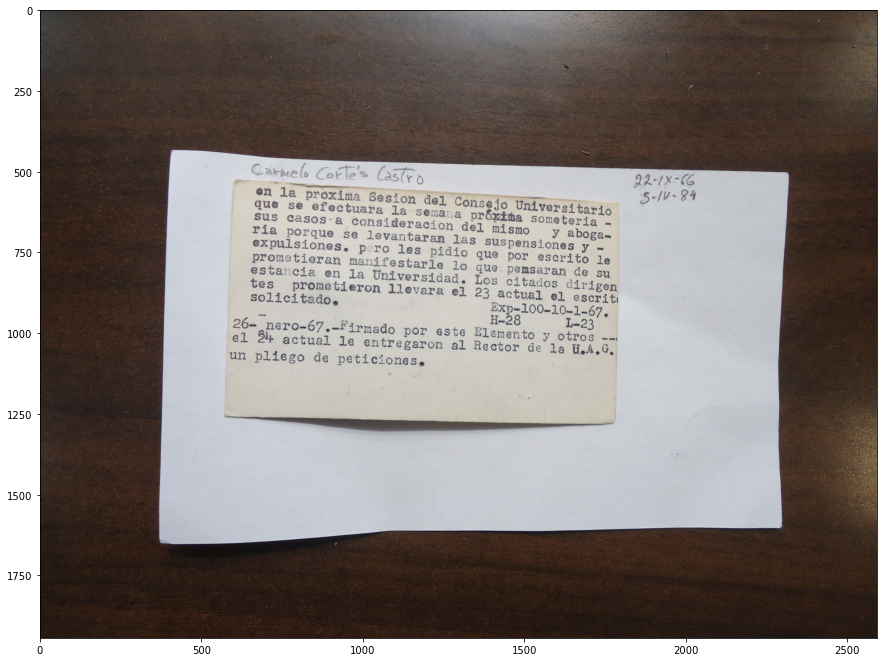

In [14]:
img_nc = np.array(utils.open_idx(df_trans, ROOT, 100))
plt.imshow(img_nc)

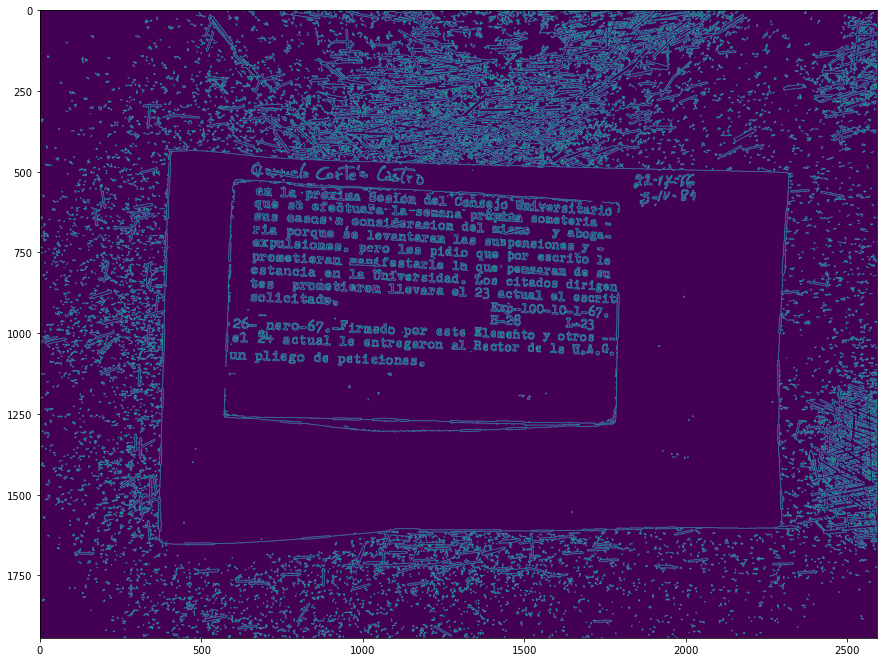

In [21]:
# Convert to grayscale
img_ed_g = cv2.cvtColor(img_nc, cv2.COLOR_RGB2GRAY)
# Perform edge detection
edges = cv2.Canny(img_ed_g, 30, 100)
plt.imshow(edges)

In [22]:
# detect lines in the image using hough lines technique
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 15, np.array([]), 50, 5)

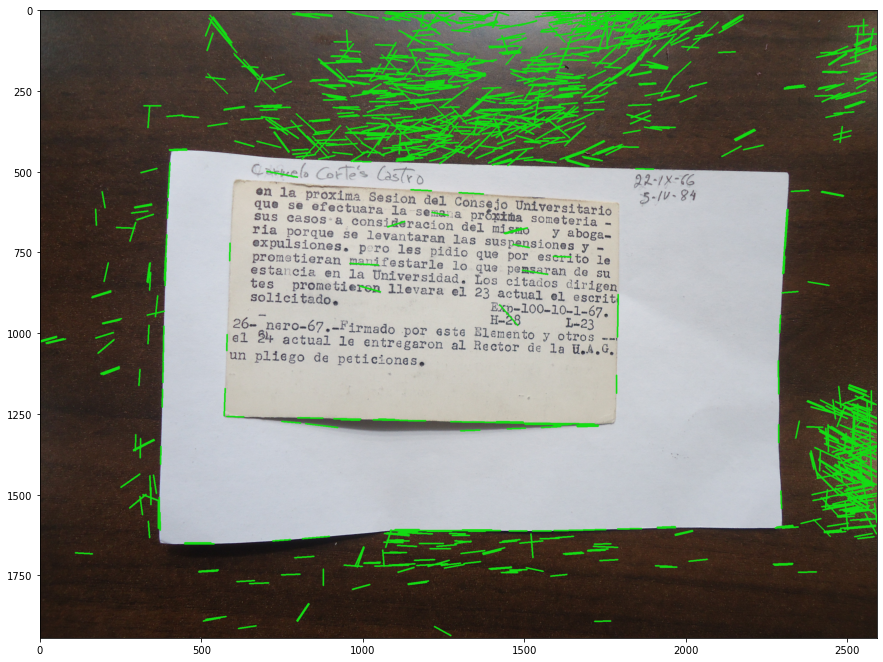

In [23]:
# iterate over the output lines and draw them
for line in lines:
    for x1, y1, x2, y2 in line:
        cv2.line(img_nc, (x1, y1), (x2, y2), (20, 220, 20), 3)

plt.imshow(img_nc)

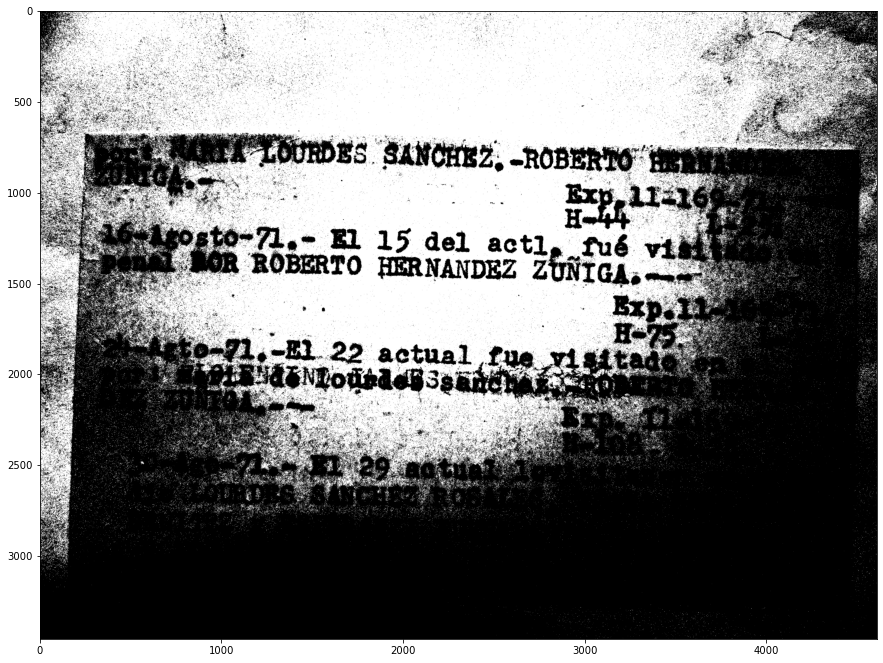

In [69]:
import cv2
import numpy as np

# read image as grayscale
img = np.array(utils.open_idx(df_trans, ROOT, 300))

# convert to grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# threshold
thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)[1]\

# apply morphology
kernel = np.ones((7,7), np.uint8)
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((9,9), np.uint8)
morph = cv2.morphologyEx(morph, cv2.MORPH_ERODE, kernel)

# get largest contour
contours = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
contours = contours[0] if len(contours) == 2 else contours[1]
area_thresh = 0
for c in contours:
    area = cv2.contourArea(c)
    if area > area_thresh:
        area_thresh = area
        big_contour = c


# get bounding box
x,y,w,h = cv2.boundingRect(big_contour)

# draw filled contour on black background
mask = np.zeros_like(gray)
mask = cv2.merge([mask,mask,mask])
cv2.drawContours(mask, [big_contour], -1, (255,255,255), cv2.FILLED)

# apply mask to input
result1 = img.copy()
result1 = cv2.bitwise_and(result1, mask)

# crop result
result2 = result1[y:y+h, x:x+w]

# view result
utils.show_bgr_image_in_plt(thresh)



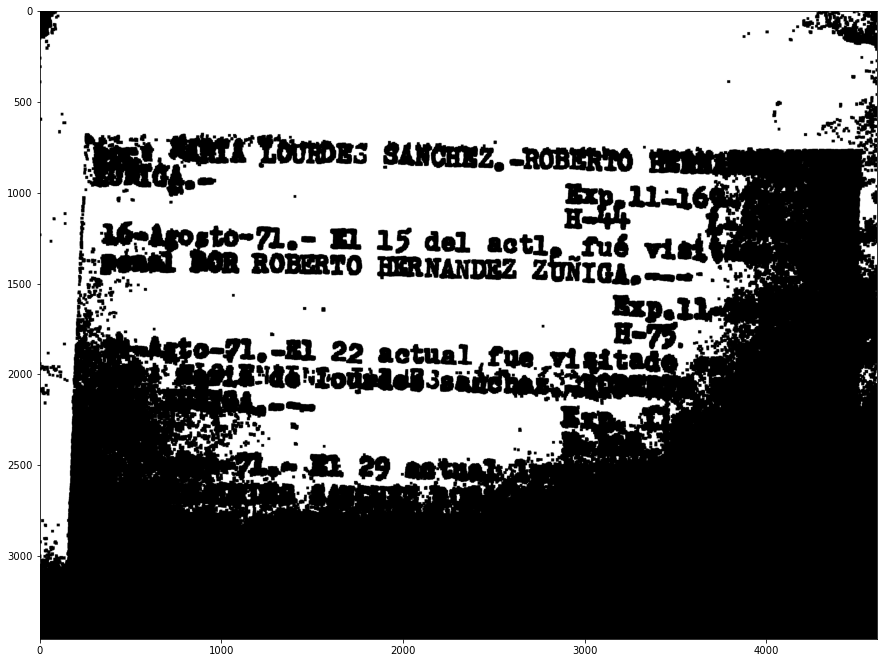

In [70]:
utils.show_bgr_image_in_plt(morph)



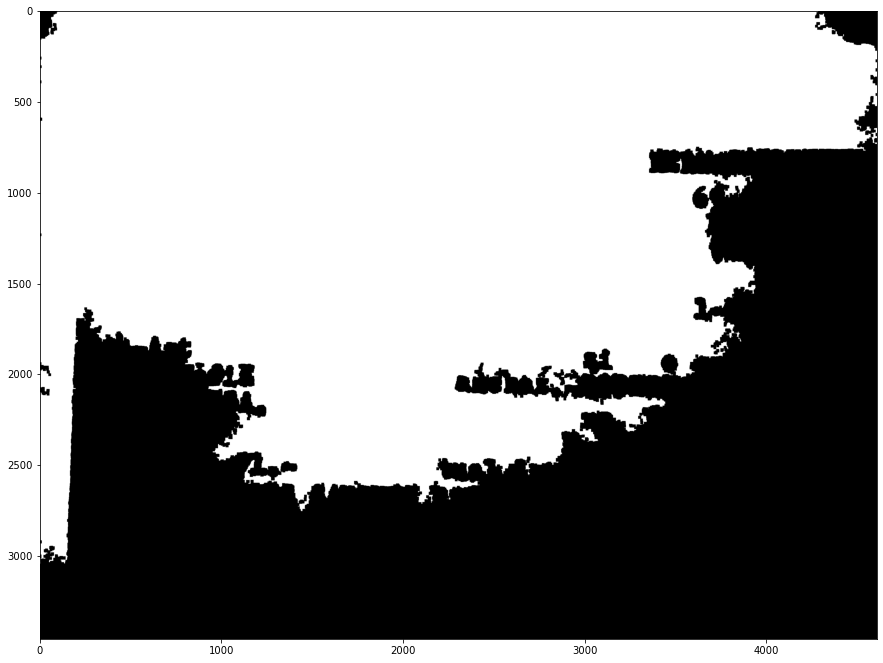

In [71]:
plt.imshow(mask)



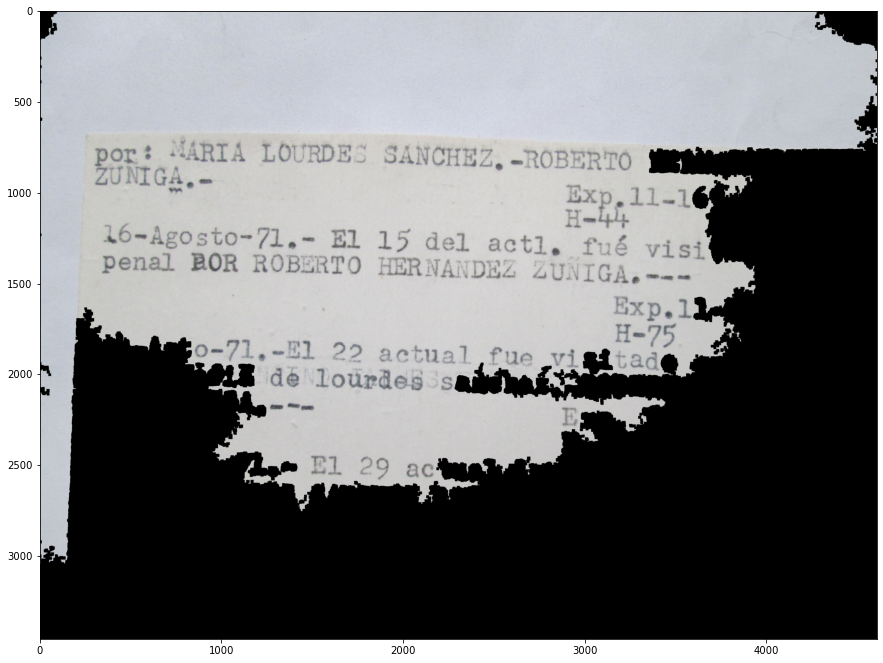

In [72]:

plt.imshow(result1)

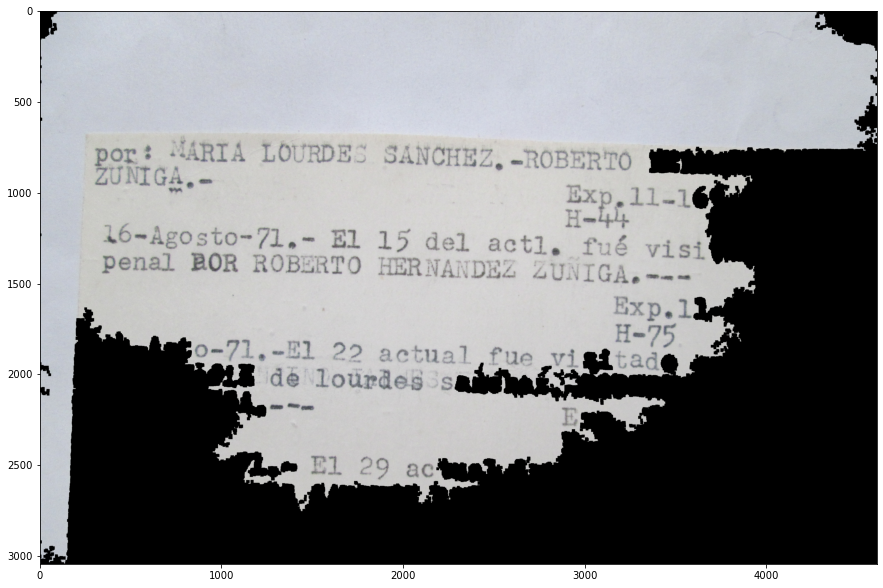

In [73]:
plt.imshow(result2)